<a href="https://colab.research.google.com/github/JudsonLima/computationalImaging/blob/master/HW4_JudsonLimaFinal_Q4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computational Imaging HW 4

Judson Lima

OPTI 556, Fall 2023

### Coded apeture tomography using a forward model for a system that measures a similar 2D object space from two different angles (e.g. with a coded aperture normal to the x-axis and a coded aperture normal to the y-axis.)

Libraries

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from scipy import signal
from scipy import integrate
%matplotlib inline
plt.rcParams['figure.figsize'] = [30, 10]
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Model
import cv2
from keras.datasets import mnist

plt.rcParams['figure.figsize'] = [20, 10]

## 2D reconstruction from 1D measurement data.



In [3]:
l= 10
delta=1
N=28
M=128
code=np.random.randint(0,2,M)
def t(x):
  t=code[np.int(np.floor((x+M/2)/delta))]
  return t
vt=np.vectorize(t)
def p(j):
  xj, yj=delta*divmod(j,N)
  xj=xj-N*delta/2
  yj=yj+l
  return xj, yj
def g(j,x):
  g=t((x+(l/p(j)[1])*p(j)[0])/(1+(l/p(j)[1])))
  return g
def h(i,j):
  h=integrate.quad(lambda x: g(j,x), (i-M/2)*delta-delta/2,(i-M/2)*delta +delta/2)[0]
  return h
H=np.zeros((M,N**2))
for j in range(N**2):
  for i in range(M):
    H[i,j]=h(i,j)

<ipython-input-3-192c8d239c1b>:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  t=code[np.int(np.floor((x+M/2)/delta))]


<ipython-input-3-192c8d239c1b>:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  t=code[np.int(np.floor((x+M/2)/delta))]


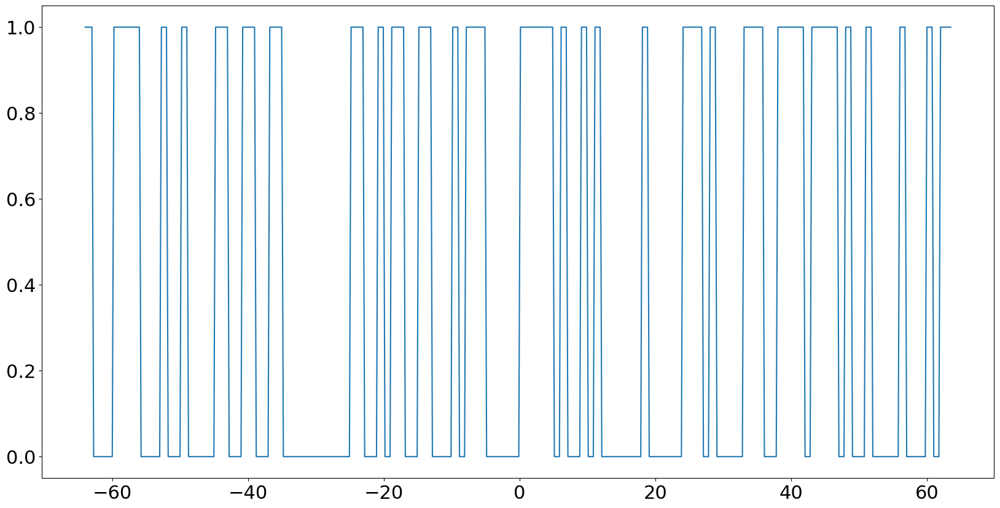

In [4]:
plt.rcParams['figure.figsize'] = [20, 10]

xspace=np.linspace(-M*delta/2,(M-1)*delta/2,512)
plt.plot(xspace,vt(xspace))

Forward model H for a 128 detector with a random code observing a 28 × 28 element object space. The distance from the coded aperture to the detector is 10 pixel spacings. The object space begins a further 10 pixels beyond the code. The pixel spacing in the object, the code and the detector are all assumed to be equal.


(128, 784)


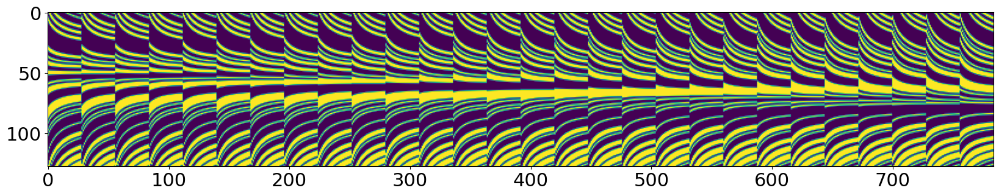

In [5]:
plt.imshow(H)
print(H.shape)

Load and prepare data

In [6]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train=x_train.astype("float32")/255.0
x_test=x_test.astype("float32")/255.0

11490434/11490434 [==============================] - 0s 0us/step


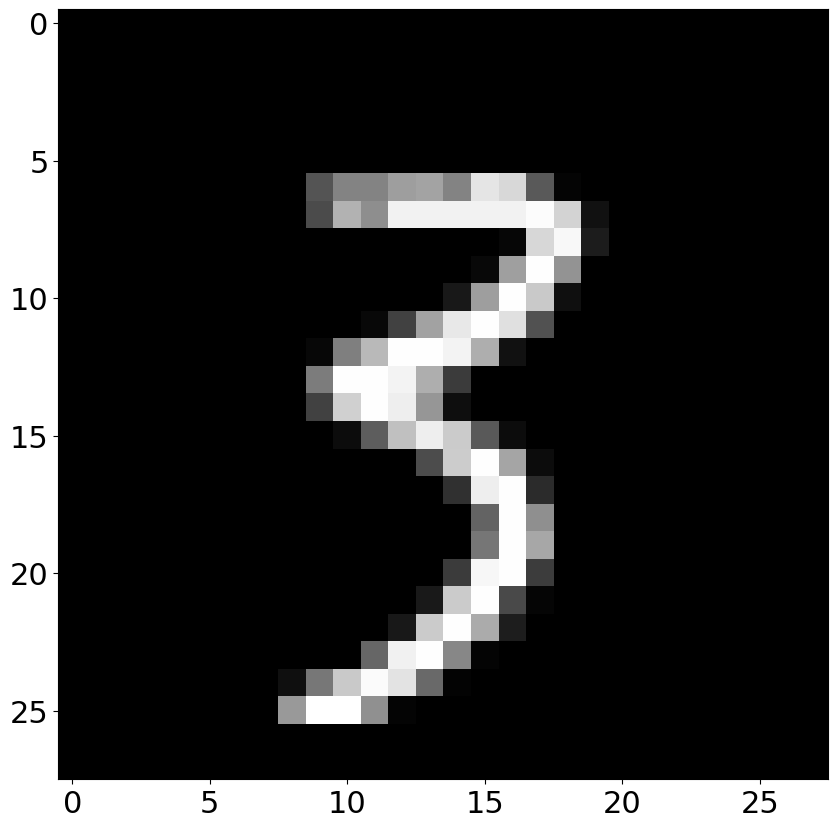

In [7]:
plt.imshow(x_train[878],cmap='gray')



1D measurement values after running the above raster image of the number 3 through the forward model

([], [])

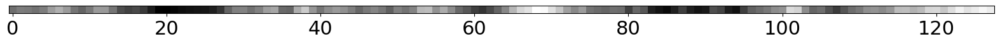

In [8]:
g = np.reshape(np.matmul(H,np.reshape(x_train[878],N**2)),(1,128))
plt.imshow(g, cmap='gray')
plt.yticks([])

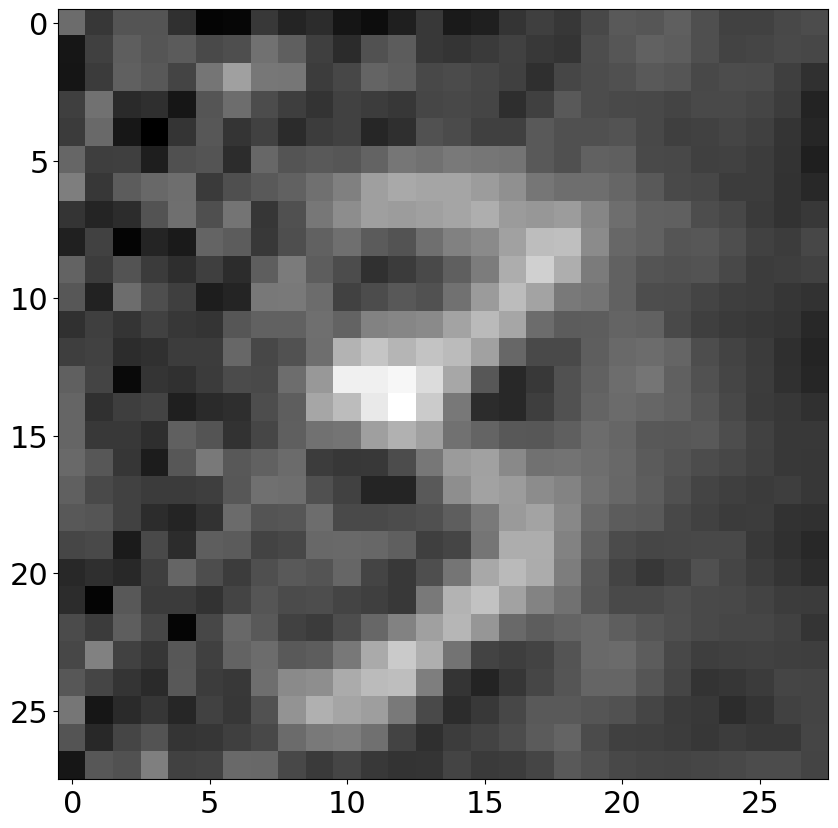

In [9]:
H_=np.reshape(np.matmul(np.linalg.pinv(H),np.matmul(H,np.reshape(x_train[878],N**2))),(N,N))
plt.imshow(H_, cmap='gray')

The resolution gets worse from left to right of the image based on the linear estimation method. The goal is to rotate the H matrix and project it back on the same image to get clarity form the other angle.

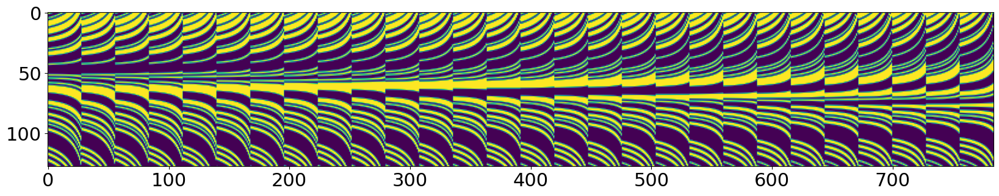

In [10]:
Hrot=np.rot90(H)
Hrot=np.rot90(Hrot)
plt.imshow(Hrot)

*Note that the pattern of H above has flipped, and the curves are facing the opposite direction. Now if we apply our new H to the object and reconstruct the image using a pseudoinverse, we will see the blurring pattern has shifted from left to right and now is oriented from right to left. See how the new reconstruction of the number 6 gets blurrier as we move from right to left.*

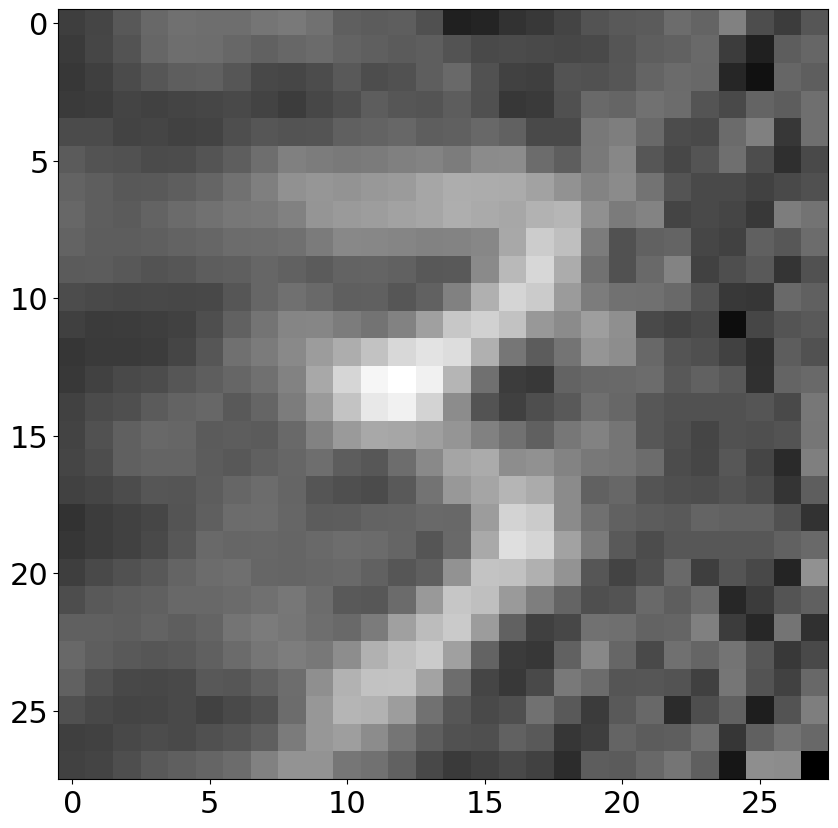

In [11]:
H_rot=np.reshape(np.matmul(np.linalg.pinv(Hrot),np.matmul(Hrot,np.reshape(x_train[878],N**2))),(N,N))
plt.imshow(H_rot, cmap='gray')

H is then concatenated with the Hrot taht was rotated by 180 degrees. This is still valid due to g = Hf, then [g1;g2] = [H1;H2]f.

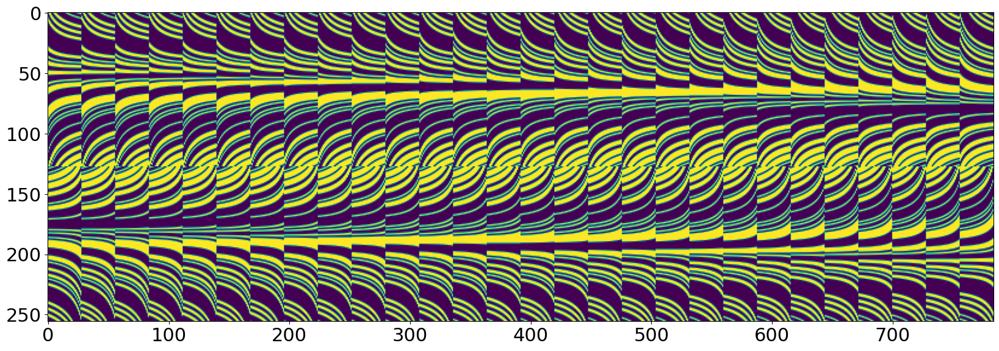

In [12]:
Htot=np.concatenate((H,Hrot), axis=0)
plt.imshow(Htot)

*Now if we apply the psuedoinverse of this concatenated matrix to the image reconstruction, we get a better result.*

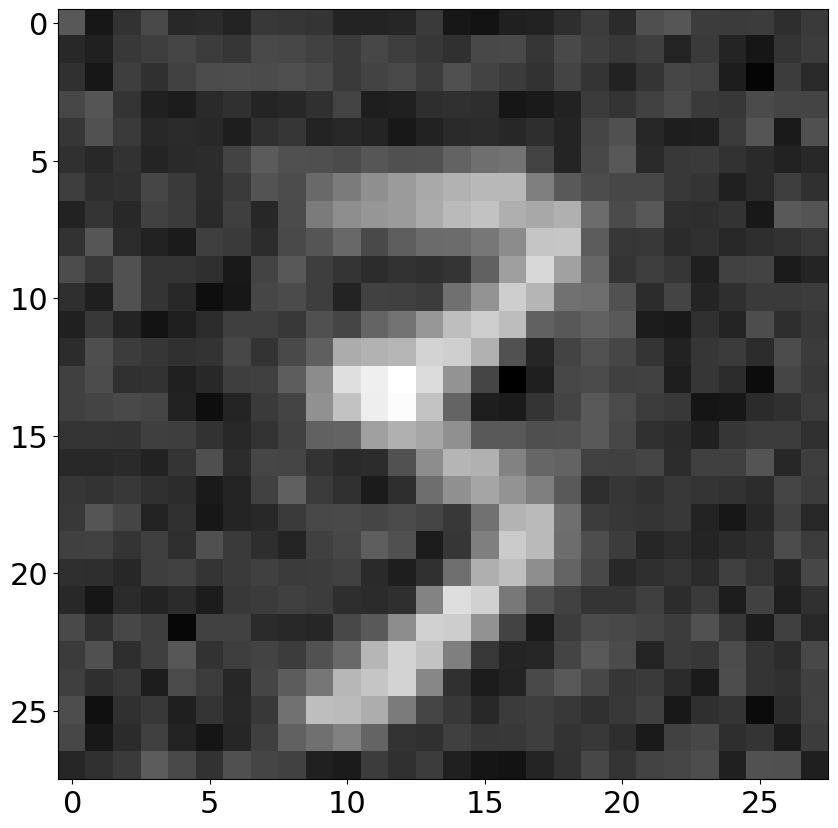

In [13]:
H_tot=np.reshape(np.matmul(np.linalg.pinv(Htot),np.matmul(Htot,np.reshape(x_train[878],N**2))),(N,N))
plt.imshow(H_tot, cmap='gray')

Text(0.5, 1.0, 'Concatenated Reconstruction')

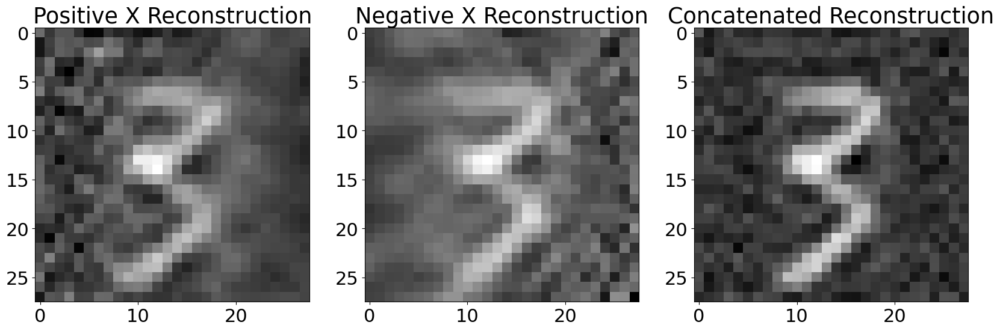

In [25]:
plt.subplot(1,3,1)
plt.imshow(H_, cmap='gray')
plt.title('Positive X Reconstruction')

plt.subplot(1,3,2)
plt.imshow(H_rot, cmap='gray')
plt.title('Negative X Reconstruction')

plt.subplot(1,3,3)
plt.imshow(H_tot, cmap='gray')
plt.title('Concatenated Reconstruction')

Next, we rotate the H by 90 degrees for the y projection.

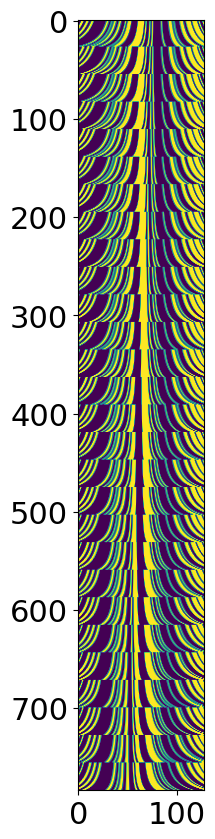

In [15]:
H1=np.rot90(H)
plt.imshow(H1)

Due to dimensions not matching the H horizontal cannot directly concatenate this rotated matrix with H, because the dimensions don't match.

To get around this, let's reshape the rotated matrix so that it is again 128 rows and 784 columns. This way, we do not lose any information, but we rearrange it for our needs.

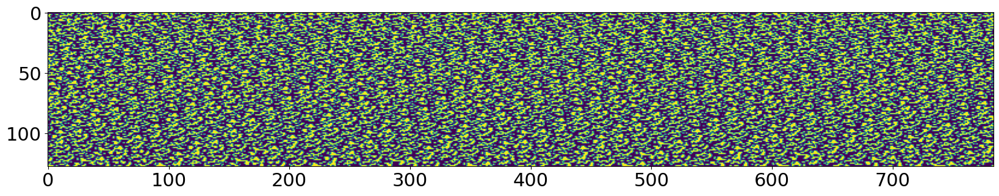

In [16]:
H1=np.reshape(H1,(128,784))
plt.imshow(H1)

*Before concatenation, we can check to see what our rotated H matrix does when we apply its pseudoinverse for image reconstruction.*

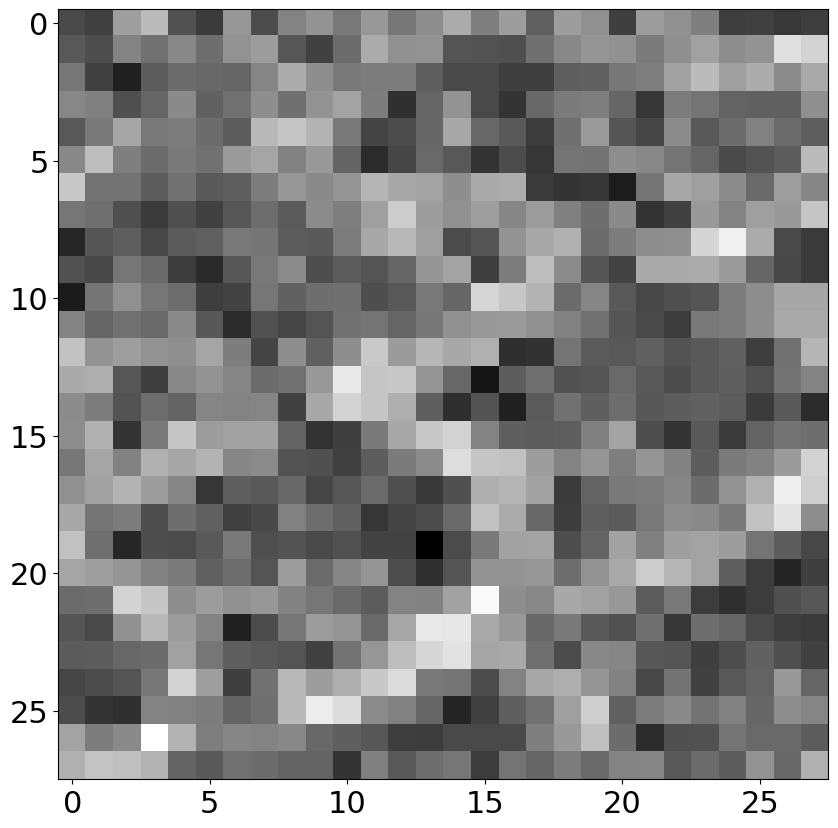

In [17]:
H_1=np.reshape(np.matmul(np.linalg.pinv(H1),np.matmul(H1,np.reshape(x_train[878],N**2))),(N,N))
plt.imshow(H_1, cmap='gray')

*We see that the image is still reconstructed, but the blur pattern is different. I'd expect to see the blur pattern move from top to bottom since we rotate the projection by 90 degrees, however we rearranged the information in that matrix to be 128 rows by 784 columns. This changes the blur pattern of the image.*

*This is more akin to using a new random transmission filter, t, but the effect will still sharpen the image once we concatenate the matrix with our original H matrix.*

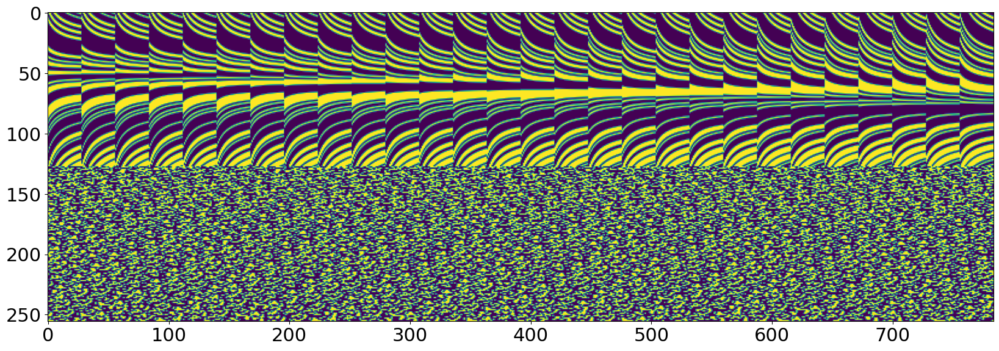

In [18]:
Htot2=np.concatenate((H,H1), axis=0)
plt.imshow(Htot2)

##Now we can apply the concatenated matrix to the linear reconstruction.

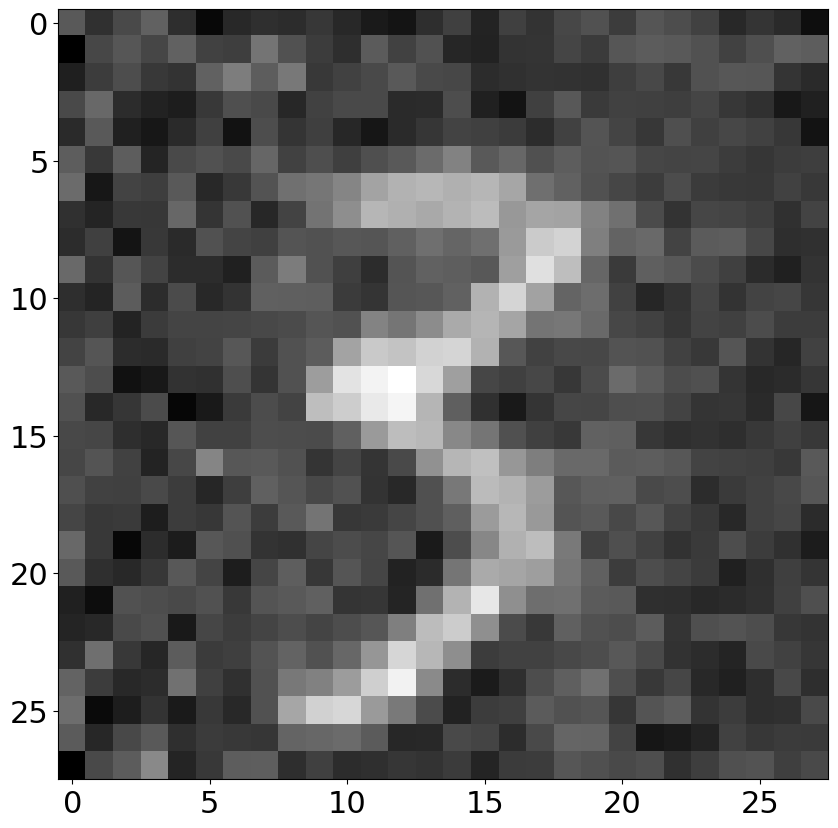

In [19]:
H_tot2=np.reshape(np.matmul(np.linalg.pinv(Htot2),np.matmul(Htot2,np.reshape(x_train[878],N**2))),(N,N))
plt.imshow(H_tot2, cmap='gray')

From left to right, the first three images are reconstruction after projection along positive X, after projection along negative X, and after concatenation of positive and negative X projections, respectively.

The 4th 5th and 6th images are reconstruction after projection along positive X, reconstruction after projection along positive Y with matrix reshaping, and reconstruction after concatenation of projection along positive X with projection along positive Y, respectively.

Text(0.5, 1.0, 'Positive X and Positive Y')

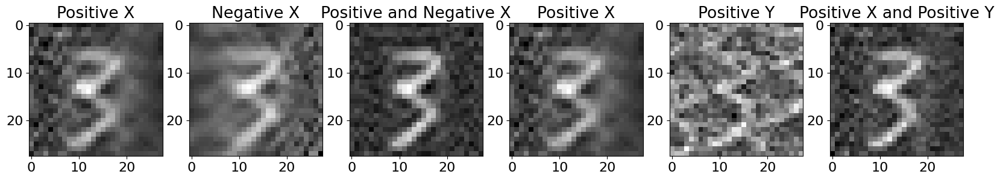

In [26]:
plt.rcParams.update({'font.size': 16})

plt.subplot(1,6,1)
plt.imshow(H_, cmap='gray')
plt.title('Positive X')

plt.subplot(1,6,2)
plt.imshow(H_rot, cmap='gray')
plt.title('Negative X')

plt.subplot(1,6,3)
plt.imshow(H_tot, cmap='gray')
plt.title('Positive and Negative X')

plt.subplot(1,6,4)
plt.imshow(H_, cmap='gray')
plt.title('Positive X')

plt.subplot(1,6,5)
plt.imshow(H_1, cmap='gray')
plt.title('Positive Y')

plt.subplot(1,6,6)
plt.imshow(H_tot2, cmap='gray')
plt.title('Positive X and Positive Y')

Note: that in both cases of concatenation, regardless of the projection directions are larger H matrix leads to a clearer result when it is used for the reconstruction.

New H matrix after concatenating all three projections. Note: that the positive Y projection has been reshaped so that its dimesions are appropriate for concatenation.

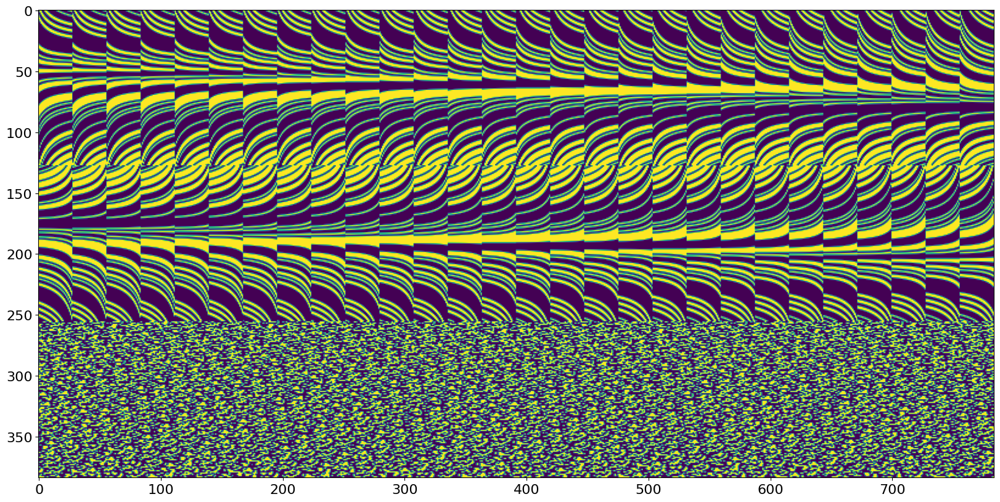

In [28]:
Htot3=np.concatenate((Htot,H1), axis=0)
plt.imshow(Htot3)

Applying the H matrix to the image reconstruction results in the most improved result so far

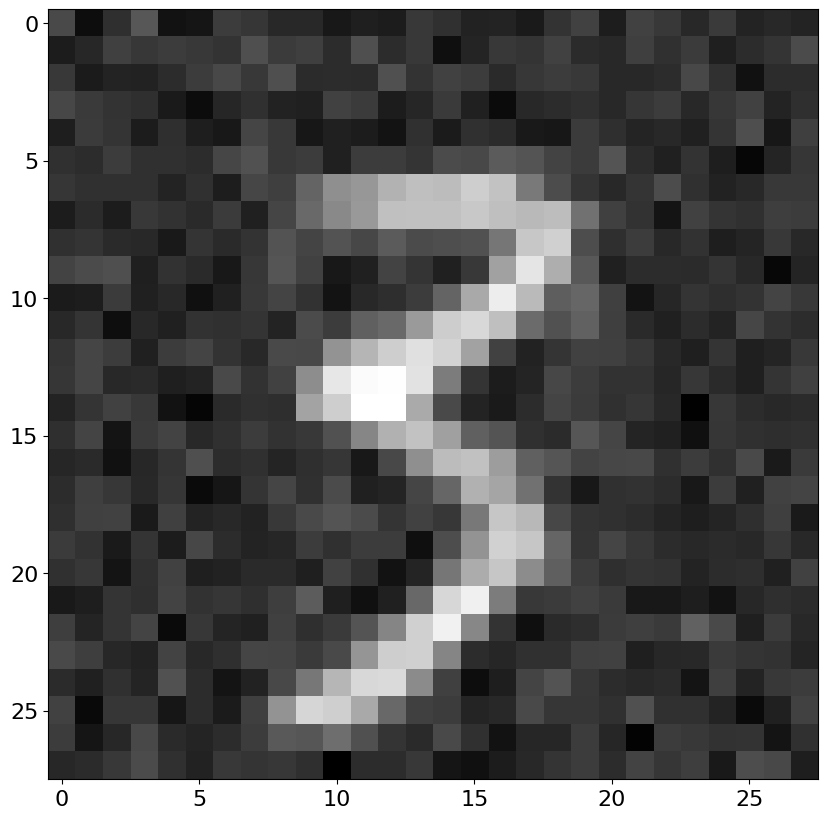

In [29]:
H_tot3=np.reshape(np.matmul(np.linalg.pinv(Htot3),np.matmul(Htot3,np.reshape(x_train[878],N**2))),(N,N))
plt.imshow(H_tot3, cmap='gray')

Text(0.5, 1.0, 'Positive X, Negative X, and Positive Y')

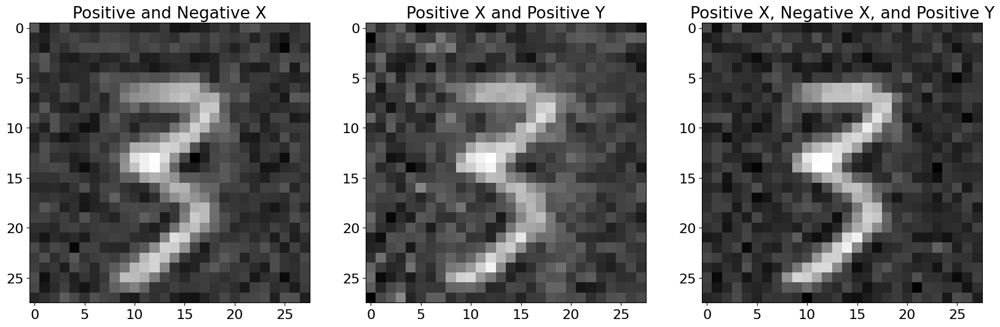

In [30]:
plt.subplot(1,3,1)
plt.imshow(H_tot, cmap='gray')
plt.title('Positive and Negative X')

plt.subplot(1,3,2)
plt.imshow(H_tot2, cmap='gray')
plt.title('Positive X and Positive Y')

plt.subplot(1,3,3)
plt.imshow(H_tot3, cmap='gray')
plt.title('Positive X, Negative X, and Positive Y')

The rotated H matrix for the negative Y projection.

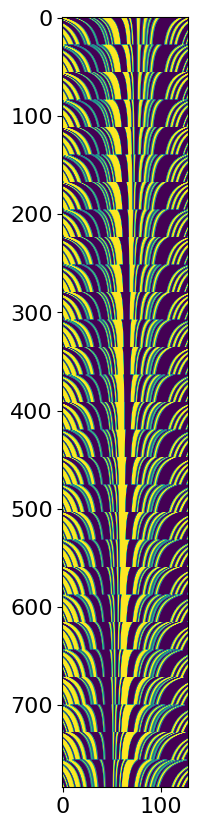

In [31]:
H2 = np.rot90(H)
H2 = np.rot90(H2)
H2 = np.rot90(H2)
plt.imshow(H2)

Again reshape this matrix so the dimesions are suitable for concatenation.

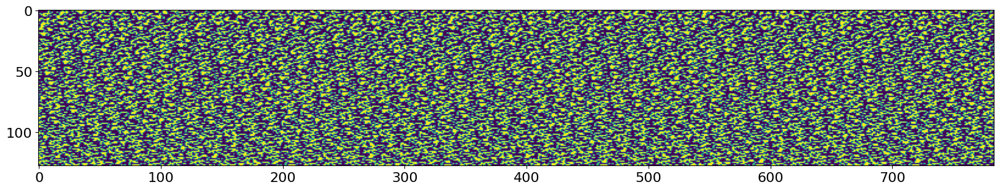

In [33]:
H2=np.reshape(H2,(128,784))
plt.imshow(H2)

Now we can concatenate all 4 of our rotated H matrices.

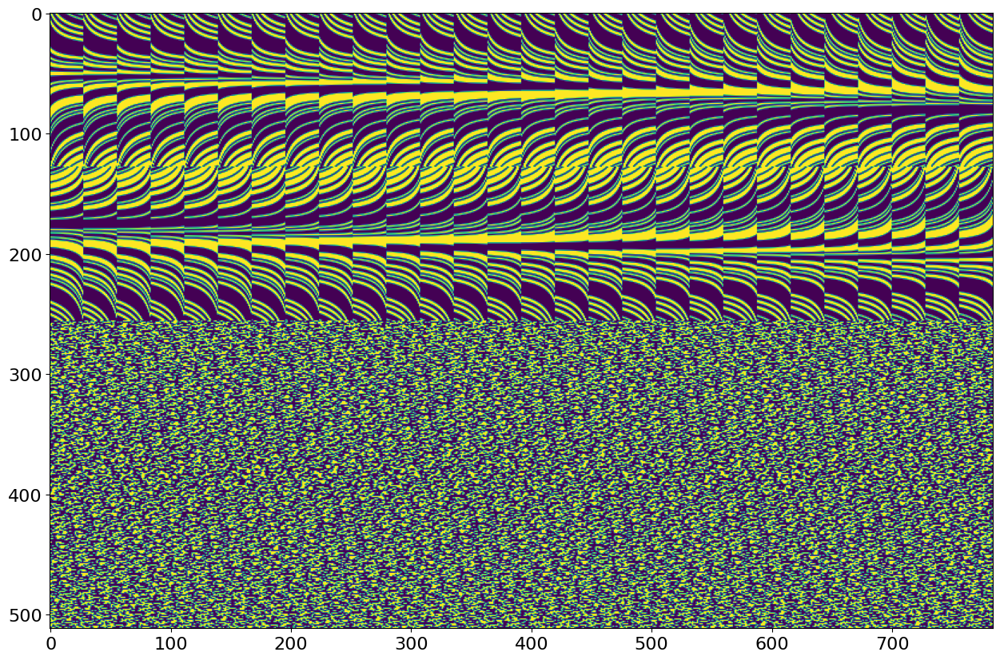

In [34]:
Htot4=np.concatenate((Htot3,H2), axis=0)
plt.imshow(Htot4)

Finally, we can apply this concatenated matrix to image reconstruction.

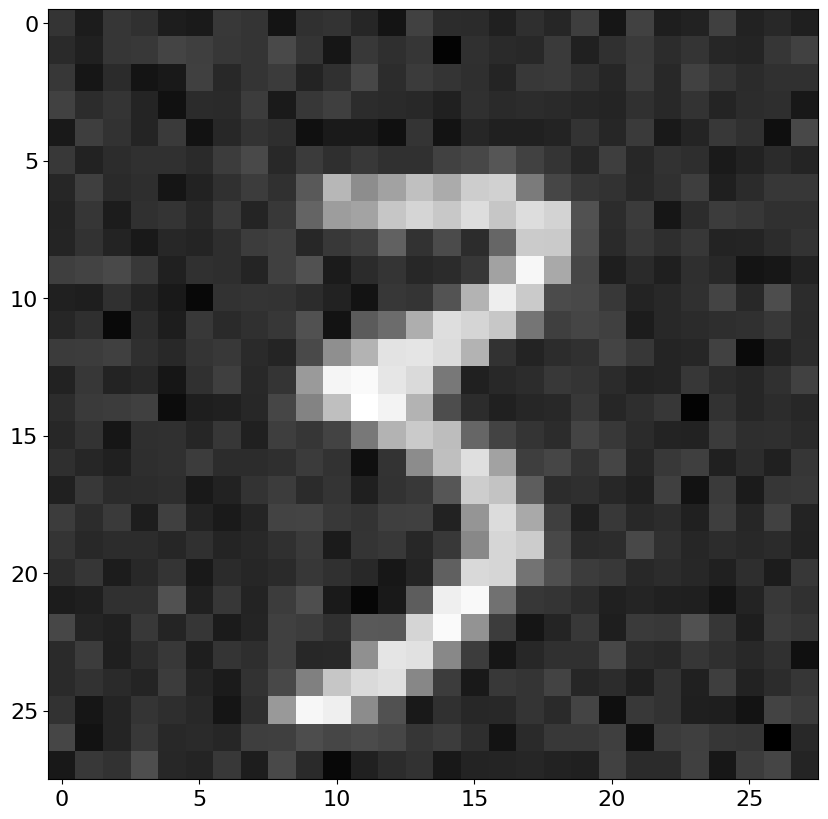

In [35]:
H_tot4=np.reshape(np.matmul(np.linalg.pinv(Htot4),np.matmul(Htot4,np.reshape(x_train[878],N**2))),(N,N))
plt.imshow(H_tot4, cmap='gray')

Text(0.5, 1.0, 'Along X, Y, -X, & -Y')

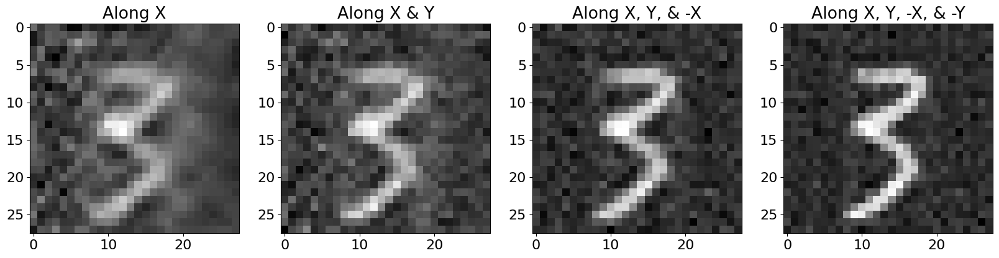

In [36]:
plt.subplot(1,4,1)
plt.imshow(H_, cmap='gray')
plt.title('Along X')

plt.subplot(1,4,2)
plt.imshow(H_tot2, cmap='gray')
plt.title('Along X & Y')

plt.subplot(1,4,3)
plt.imshow(H_tot3, cmap='gray')
plt.title('Along X, Y, & -X')

plt.subplot(1,4,4)
plt.imshow(H_tot4, cmap='gray')
plt.title('Along X, Y, -X, & -Y')

## Results

2D reconstruction is possible from a set of 1D measurements using linear methods such as OLS. Taking projections from multiple directions and implementing concatenated versions of the data to create H increases the accuracy of the image reconstruction. This is because when we concatenate H, we improve the function used in the linear reconstruction.


The benefit stems from H not needing to be the full apeture and can in turn be a subsampled amount, then adding in more projections from other angles we can add to the overall H and get a larger H, making the end result more sparse for
a linear reconstruction.


In real life scenarios, careful consideration must be used to offset the cost of having to take multiple passes for a larger H. One example would be taking more projections in X-ray tomography leads to more radiation exposure for the patient. The exposure of each image is the same so the amount of rays to the patient will need to benefit the cost comporated to the resolution needed for an image.